# Jason Dylla
## Opti 596 HW 5
## David Brady

1. Consider the notebook on the course github at this link. The notebook uses the SIFT and ORB algorithm to find and match keypoints between a pair of images and generates a homography mapping one image onto the view point of the other. The notebook then uses a mask to stitch two images together.
Repeat the processes in this notebook for image pairs taken with your own camera.
2. Use hugin to create a panorama from 10-15 narrow field shots taken with your phone. include screen shots of the key point matching between image pairs in your report. Post full scale panorams to d21. What is the pixel count of your panoramas? report on stitching artifacts, image quality and image resolution in the stiched panoramas.



Canal Park
dim - 11638 × 2291
artifacts- side walk looks like the grass is growing over it
image quality - image looks good as far as quality goes, resolution is nice.
iphone pano - the iphone looks really good, there does not seem to be any issues with the sidewalk or other things, also the grass looks greener and overall looks nice.


Statehouse
dim - 9487 × 2284
artifacts- flower bed is messed up. the sidewalk and the building looks warpped and cury towards the edge of the picture.
image quality - image looks good, resolution is nice.


Optisci
dim - 12002 × 3085
artifacts- zooming into the stop sign and looking at the farther stop sign there is a weird line that is off.  
image quality - image looks the best out of the hugin made panos, resolution is very nice.


Here is an image of the control points or key points that hugin found between the two images. I see that most of the points line up with eachother.

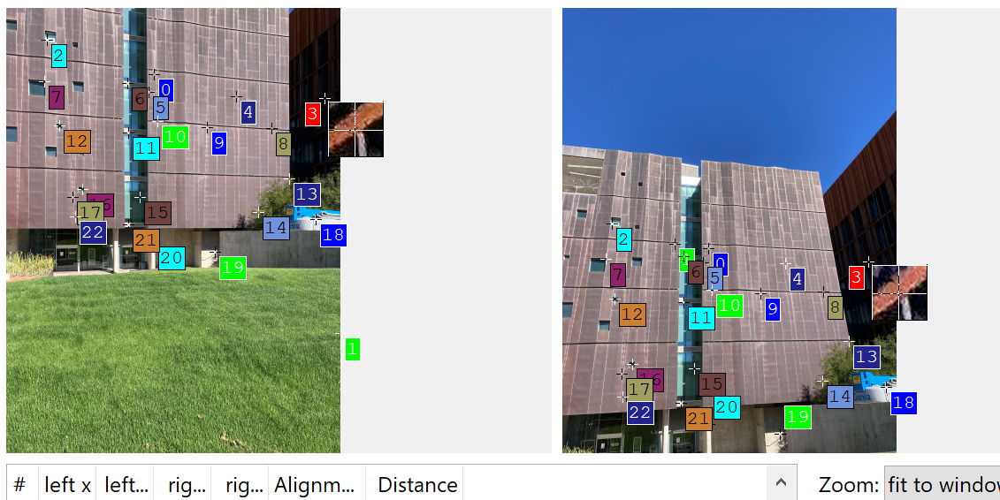

# Keypoints, keypoint matching, homography and warping
## David Brady
## University of Arizona
## Spring 2023

This notebook illustrates keypoint identification and matching in image pairs. We also illustrate the use of keypoint pairs to determine homography between images and the use of homography to warp images to common viewpoint.

### load libraries and images

In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
from scipy.special import erf
from skimage import data, filters
from scipy import ndimage
from google.colab import files

%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams.update({'font.size': 22})

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# From HW5
top = '/content/drive/MyDrive/OPTI596ComPho/HW5/Opsci /top.JPG'
bottom = '/content/drive/MyDrive/OPTI596ComPho/HW5/Opsci /bottom.JPG'
tt = '/content/drive/MyDrive/OPTI596ComPho/HW5/stateHouse/t.JPG'
bb = '/content/drive/MyDrive/OPTI596ComPho/HW5/stateHouse/b.JPG'

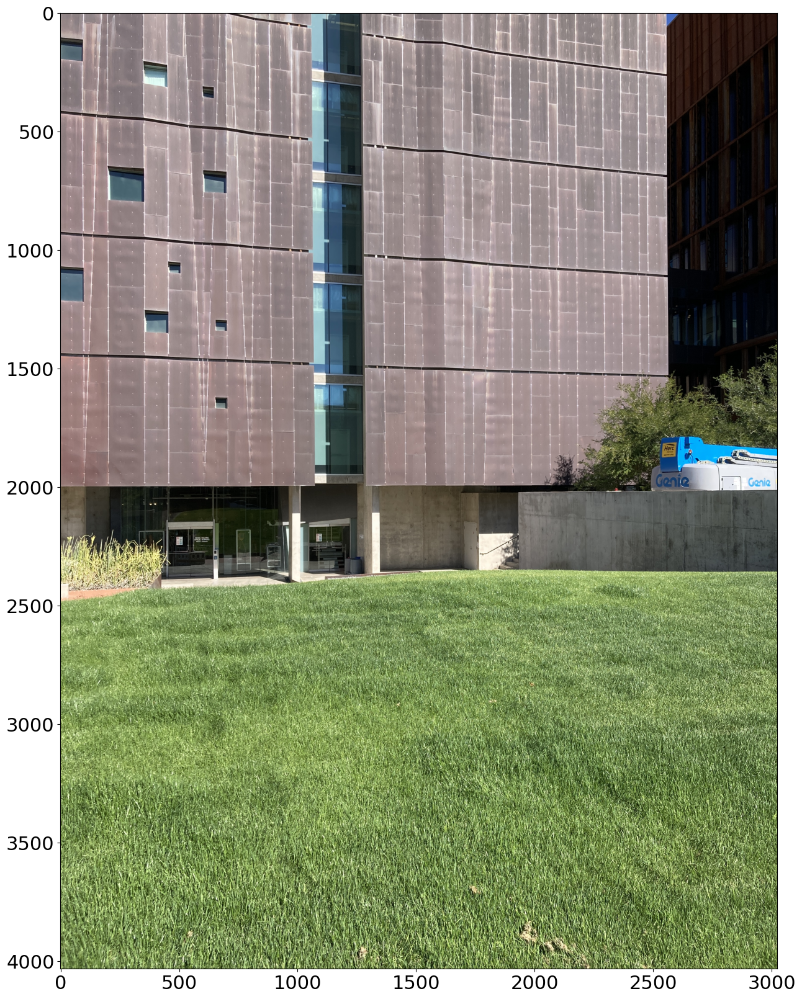

In [4]:
import cv2

# Read the image in BGR format
image_bgr1 = cv2.imread(top)

# Convert the image from BGR to RGB
t1 = cv2.cvtColor(image_bgr1, cv2.COLOR_BGR2RGB)
image_bgr2 = cv2.imread(bottom)

# Convert the image from BGR to RGB
b2 = cv2.cvtColor(image_bgr2, cv2.COLOR_BGR2RGB)
# Display the image in RGB format
plt.imshow(b2)
plt.show()
tt=cv2.imread(tt)
bb=cv2.imread(bb)
tt = cv2.cvtColor(tt, cv2.COLOR_BGR2RGB)
bb = cv2.cvtColor(bb, cv2.COLOR_BGR2RGB)
tt= cv2.cvtColor(tt, cv2.COLOR_BGR2GRAY)
bb= cv2.cvtColor(bb, cv2.COLOR_BGR2GRAY)

In [ ]:
print(type(gray))
print(type(t1))
print(t1.shape)
print(gray.shape)
gt = cv2.cvtColor(t1, cv2.COLOR_BGR2GRAY)
gb = cv2.cvtColor(b2, cv2.COLOR_BGR2GRAY)
print(gt.shape)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(4032, 3024, 3)
(3000, 4000)
(4032, 3024)


## Example image

(-0.5, 3023.5, 4031.5, -0.5)

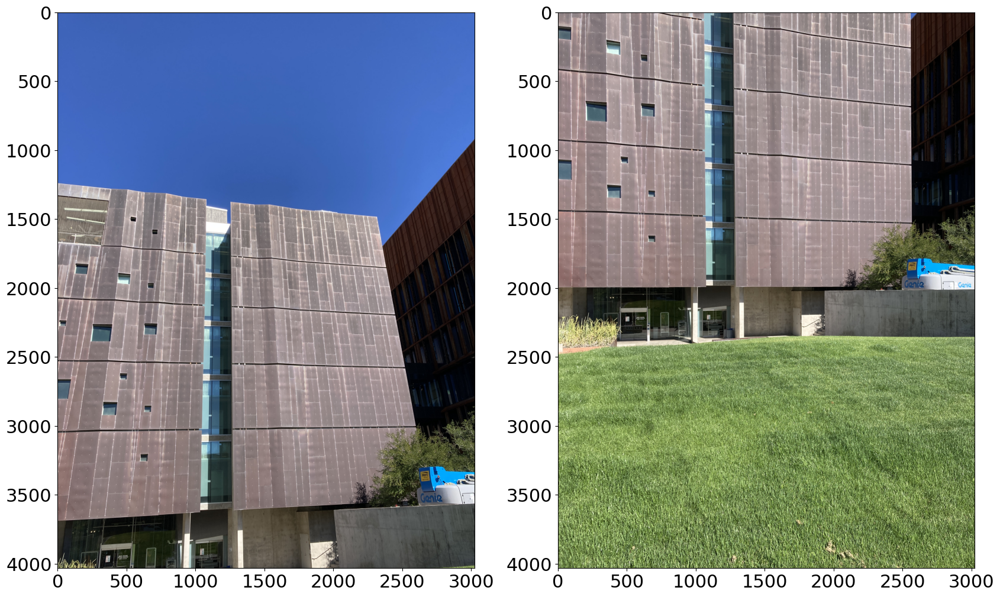

In [ ]:
plt.subplot(1,2,1)
plt.imshow(t1, cmap='gray')
plt.axis('on')
plt.subplot(1,2,2)
plt.imshow(b2, cmap='gray')
plt.axis('on')

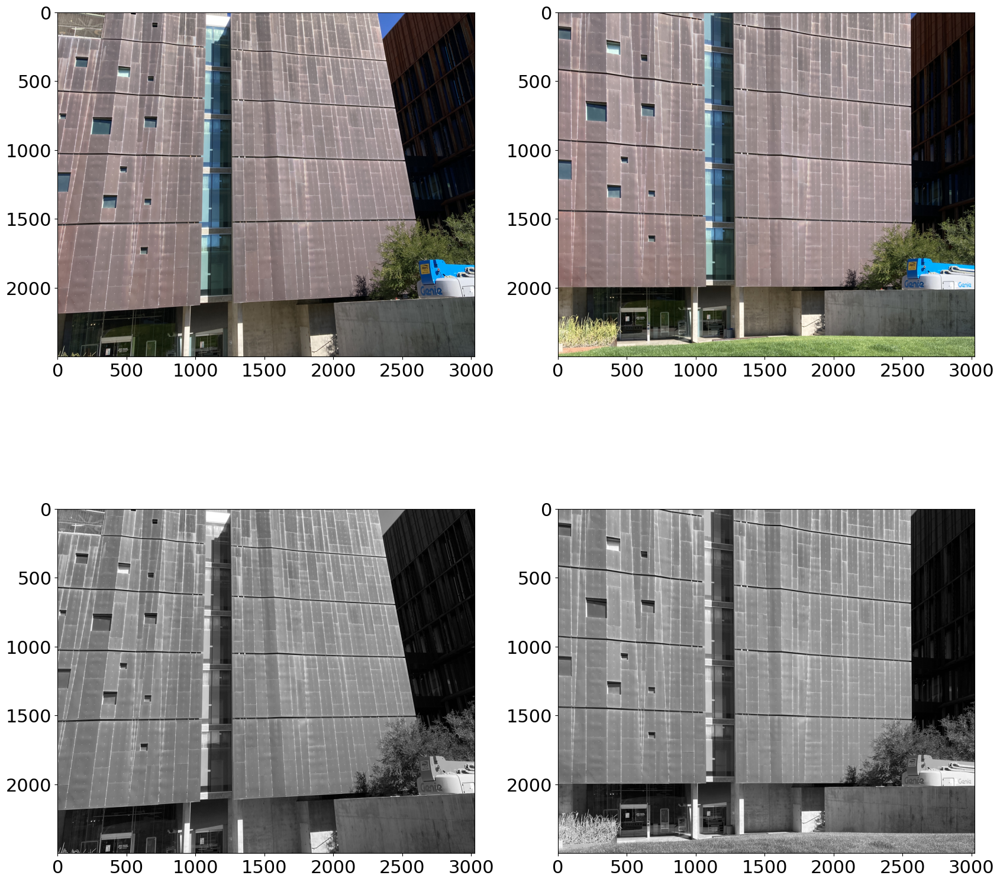

In [ ]:
plt.subplot(2,2,1)
plt.imshow(t1[1500:4000, : ],cmap='gray')
plt.subplot(2,2,2)
plt.imshow(b2[0:2500,  : ],cmap='gray')
plt.subplot(2,2,3)
plt.imshow(gt[1500:4000, : ],cmap='gray')
plt.subplot(2,2,4)
plt.imshow(gb[0:2500,  : ],cmap='gray')

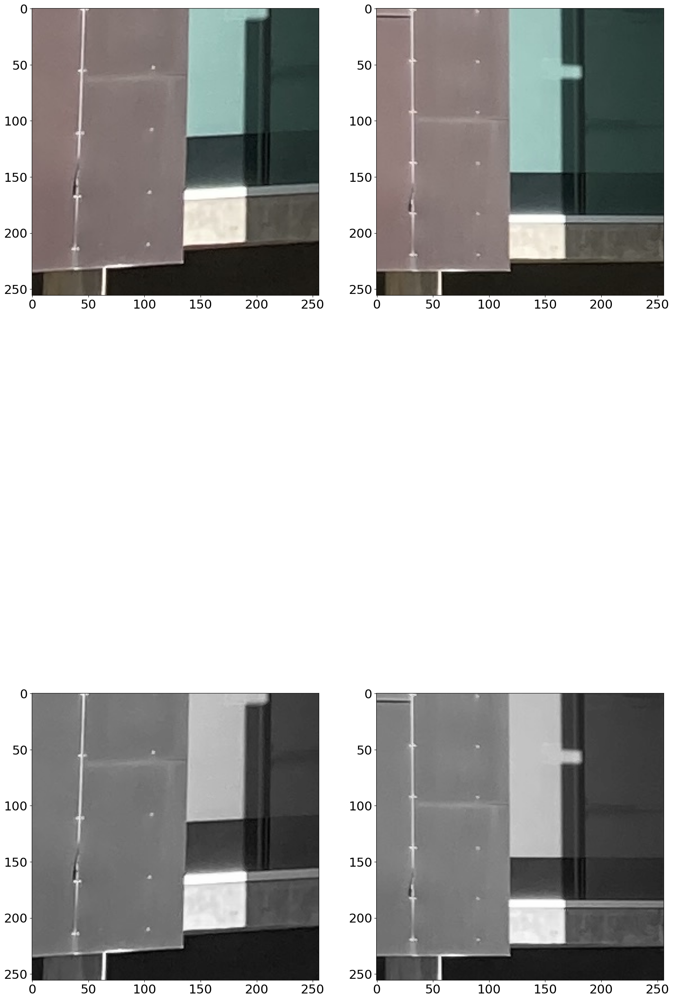

In [ ]:
plt.figure(figsize=(20,40))
plt.subplot(2,2,1)
plt.imshow(t1[3400:3656,900:1156],cmap='gray')
plt.subplot(2,2,2)
plt.imshow(b2[1760:2016,955:1211],cmap='gray')
plt.subplot(2,2,3)
plt.imshow(gt[3400:3656,900:1156],cmap='gray')
plt.subplot(2,2,4)
plt.imshow(gb[1760:2016,955:1211],cmap='gray')

## Keypoint detection and descriptors

The FAST keypoint detection algorithm identifies keypoints based on the number points in a circle around a given point that are less than the point's signal value. The actual FAST algorithm uses the "Harris corner detection" algorithm to evaluate the quality of keypoints, we implement a simplified version here. We identify a point as a keypoint if 12 of the 16 points on a surrounding circle are less than the value of the point minus a threshold. We keep a vector of the surrounding point values as a *keypoint descriptor*

In [10]:
def fast_keypoint_detector(image, threshold):
    # Step 1: Create a list of possible corner locations
    corners = []
    descriptors=[]
    for i in range(3, image.shape[0]-3):
        for j in range(3, image.shape[1]-3):
            if is_corner(image, i, j, threshold)[0]:
                corners.append((i, j))
                descriptors.append(is_corner(image, i, j, threshold)[1])
    return corners, descriptors

def is_corner(image, i, j, threshold):
    # Step 2: Check if the pixel at (i, j) is brighter or darker than its surrounding pixels
    pixel_value = image[i, j]
    descriptor=np.zeros(16)
    #if pixel_value < threshold or pixel_value > 255-threshold:
    #    return False
    pk=0
    for k in range(16):
        angle = k * np.pi / 8
        x = int(round(i + 3*np.cos(angle)))
        y = int(round(j + 3*np.sin(angle)))
        descriptor[k]=image[x, y]
        if image[x, y] < (pixel_value - threshold):
            pk=pk+1
    if pk>12:
        return True, descriptor/np.linalg.norm(descriptor)
    return False, []

def keypointMask(image, corners):
    oimage=np.stack((image,image,image),axis=-1)
    for k in corners:
        oimage[(k[0]-3):(k[0]+3),(k[1]-3):(k[1]+3),0]=255
    return oimage

The diameter of the surrounding circle may vary. For the algorithm implemented here, the figure below shows the 16 evaluation points in yellow.

3 0
3 1
2 2
1 3
0 3
-1 3
-2 2
-3 1
-3 0
-3 -1
-2 -2
-1 -3
0 -3
1 -3
2 -2
3 -1


(-0.5, 10.5, 10.5, -0.5)

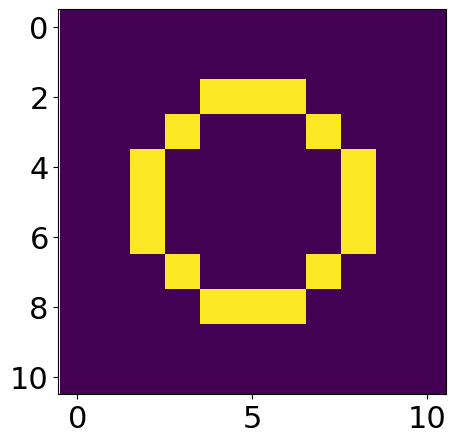

In [11]:
pip=np.zeros((11,11))
for k in range(16):
    angle = k * np.pi / 8
    x = int(round( 3* np.cos(angle)))
    y = int(round(3* np.sin(angle)))
    print(x,y)
    pip[x+5,y+5]=1
plt.figure(figsize=(5,5))
plt.imshow(pip)
plt.axis('equal')

## Example Keypoints

In [ ]:

corners1, des1=fast_keypoint_detector(gt[3400:3656,900:1156],20)
corners2, des2=fast_keypoint_detector(gb[1760:2016,955:1211],20)

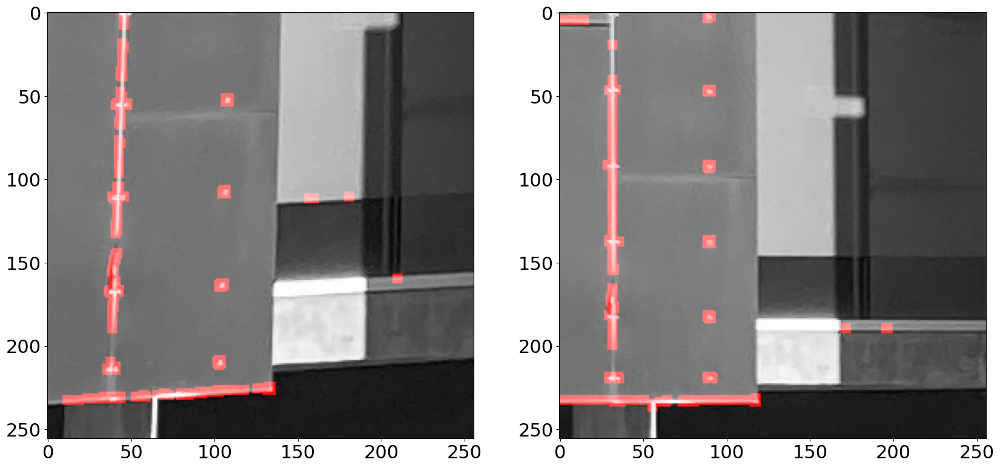

In [ ]:
plt.subplot(1,2,1)
plt.imshow(keypointMask(gt[3400:3656,900:1156],corners1))
plt.subplot(1,2,2)
plt.imshow(keypointMask(gb[1760:2016,955:1211],corners2))


Looking at the image above there are points on the right that do not line up with each image.

In [ ]:
corners1

(111, 181) point

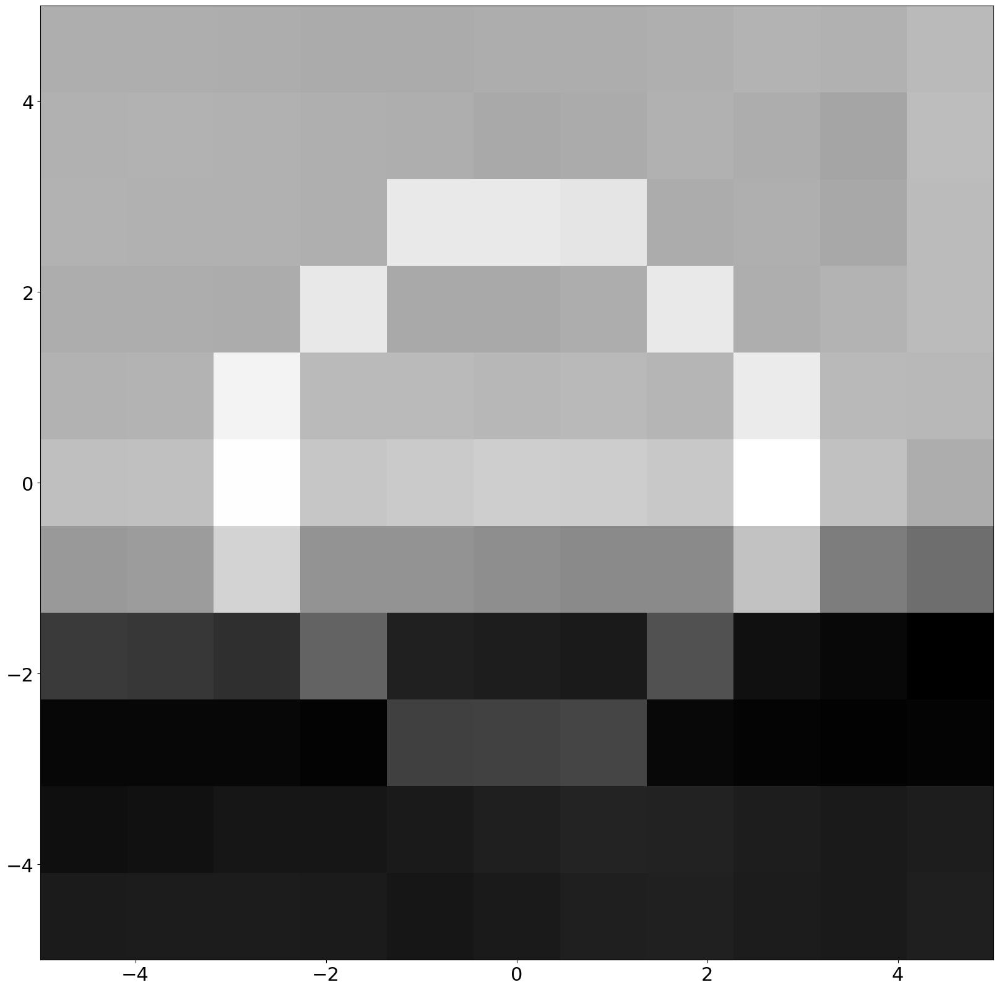

In [ ]:
plt.imshow(gt[3400+106:3400+117,900+176:900+187]+50.*pip, cmap='gray', extent=[-5,5,-5,5])


below shows how the key point in the center is the largest value.

In [ ]:
gt[3400+111,900+181]

206

In [ ]:
for k in range(16):
  angle = k * np.pi / 8
  x = int(round(111+3400 + 3*np.cos(angle)))
  y = int(round(181+900 + 3*np.sin(angle)))
  print(gt[x, y])

39
41
52
146
197
180
178
175
178
178
177
187
196
161
66
37


## Keypoint matching

We may identify keypoints as belonging to the same feature by matching keypoint descriptors. ORB, SIFT and SURF use invariances in the features to enable keypoint matching when images are rotated and rescaled. Here we consider a simple distance metric between the vector of surrounding points for each keypoint. I the current example, 22 keypoints were identified in the first image and 16 in the second. The matrix below shows the distance between each pair of keypoints. Two points may be identified as matching if their mutual distance is minimal between all pairs.

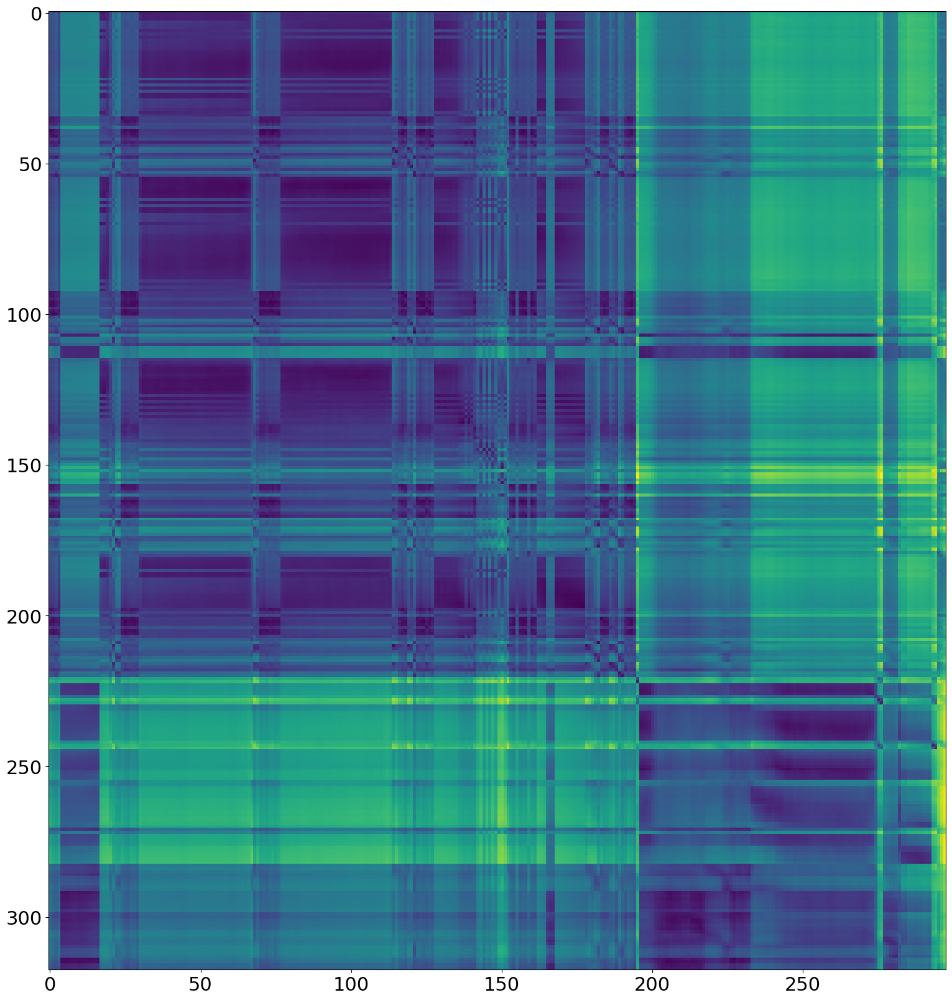

In [ ]:
dist=np.zeros((len(des1),len(des2)))
i=0
for pip in des1:
  j=0
  for pop in des2:
    dist[i,j]=np.linalg.norm(pip-pop)
    j=j+1
  i=i+1
plt.imshow(dist)

In [ ]:
matches=np.argmin(dist,axis=0)

The two images in this case are already roughly aligned. One imagines that the matches are good if the keypoint positions are similar. As shown in the table below, this is the case for most pairs, but a few are erroneously matched.

In [ ]:
for dog in range(len(des2)):
  print('point ',corners2[dog], ' in image 2 matches point ',corners1[matches[dog]], ' in image 1 ')


point  (3, 89)  in image 2 matches point  (53, 107)  in image 1 
point  (3, 90)  in image 2 matches point  (109, 107)  in image 1 
point  (3, 91)  in image 2 matches point  (53, 109)  in image 1 
point  (4, 89)  in image 2 matches point  (165, 105)  in image 1 
point  (5, 3)  in image 2 matches point  (233, 13)  in image 1 
point  (5, 4)  in image 2 matches point  (233, 12)  in image 1 
point  (5, 5)  in image 2 matches point  (233, 12)  in image 1 
point  (5, 6)  in image 2 matches point  (233, 12)  in image 1 
point  (5, 7)  in image 2 matches point  (233, 13)  in image 1 
point  (5, 8)  in image 2 matches point  (233, 12)  in image 1 
point  (5, 9)  in image 2 matches point  (233, 13)  in image 1 
point  (5, 10)  in image 2 matches point  (233, 13)  in image 1 
point  (5, 11)  in image 2 matches point  (233, 12)  in image 1 
point  (5, 12)  in image 2 matches point  (233, 12)  in image 1 
point  (5, 13)  in image 2 matches point  (233, 12)  in image 1 
point  (5, 14)  in image 2 mat

## ORB and SIFT keypoint functions

Advanced keypoint matching capabilites are built into OpenCV

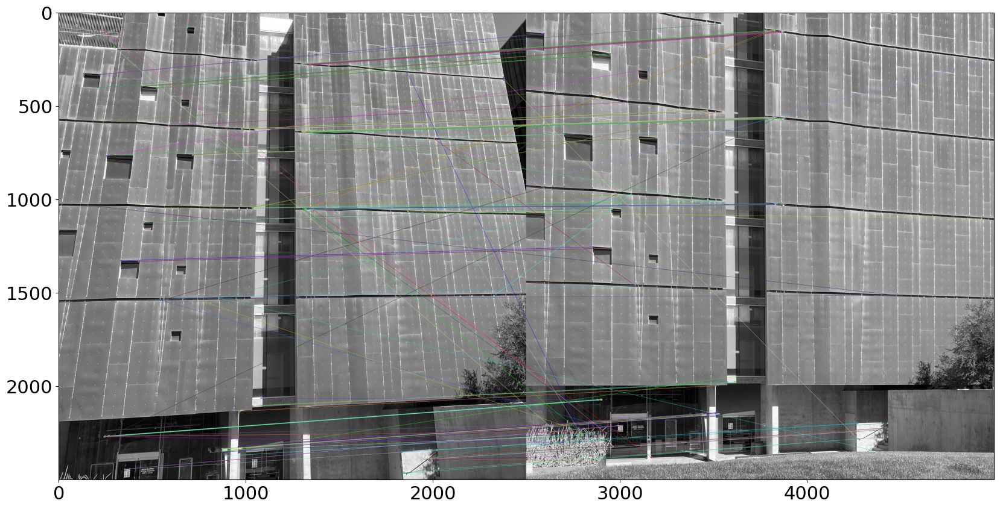

In [ ]:

# Creating an ORB object
orb = cv2.ORB_create()


img1=gt[1500:4000, 0:2500 ]
img2=gb[0:2500, 0:2500 ]
# Finding the keypoints and descriptors
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Creating a BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Matching the descriptors
matches = bf.match(des1, des2)

# Sorting the matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Drawing the first 10 matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches, None)

# Showing the result
plt.imshow( img3)


Above we can see that many lines between the images do not correspond to one another. Some of the top portions of the building are saying they correspond with the bottom of the image.

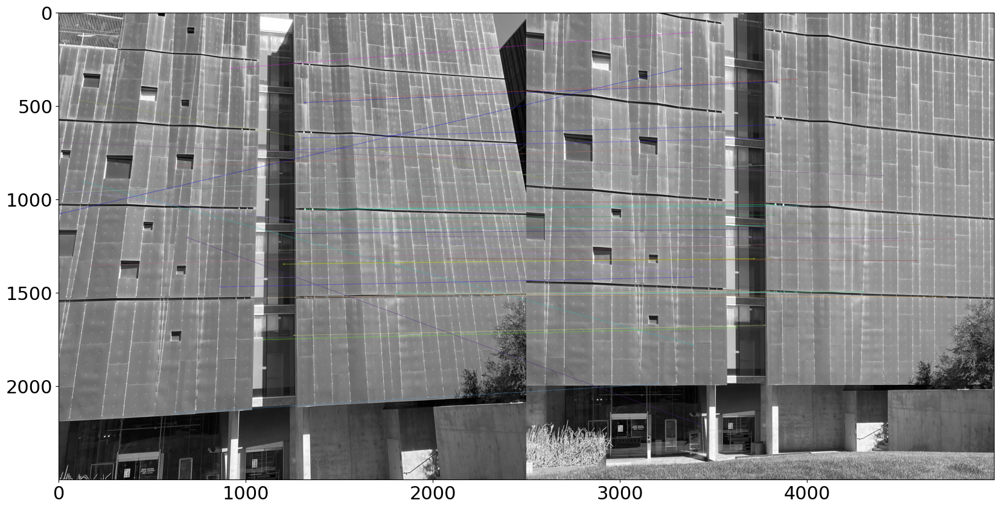

In [ ]:


# Create a SIFT object
sift = cv2.SIFT_create()

# Detect and compute keypoints and descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Create a BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Match the descriptors
matches = bf.match(des1, des2)

# Sort the matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw the first 10 matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:40], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Show the result
plt.imshow( img3)

Here there seems to be less lines with some discrepancies but less than the orb method.

In [ ]:

# find homography from SIFT keypoints



# Define the FLANN matcher parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

# Create the FLANN matcher object
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Find the matches using KNN
matches = flann.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test to filter the good matches
good = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good.append(m)

# Check if there are enough good matches
if len(good) > 10:
    # Extract the source and destination points from the good matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Find the homography matrix using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Print the homography matrix
    print('Homography matrix:')
    print(H)
else:
    # Print an error message if not enough matches are found
    print('Not enough matches are found - {}/{}'.format(len(good), 10))

Homography matrix:
[[ 1.21691605e+00  2.13980355e-01 -2.52042976e+02]
 [ 6.13901645e-02  1.42102281e+00 -3.67573064e+02]
 [ 1.96876274e-06  1.70075274e-04  1.00000000e+00]]


In [ ]:
warpImage=cv2.warpPerspective(img1,H,(2500,2500))

Text(0.5, 0, 'Image 2')

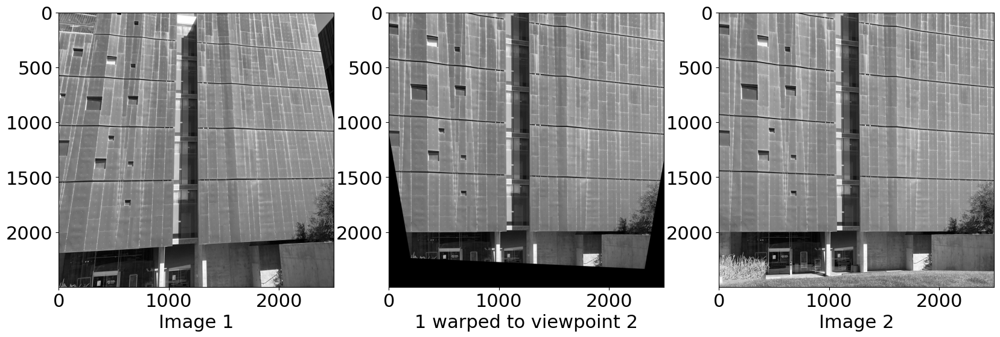

In [ ]:
plt.subplot(1,3,1)
plt.imshow(img1, cmap='gray')
plt.xlabel('Image 1')
plt.subplot(1,3,2)
plt.imshow(warpImage,cmap='gray')
plt.xlabel('1 warped to viewpoint 2')
plt.subplot(1,3,3)
plt.imshow(img2, cmap='gray')
plt.xlabel('Image 2')


The building had a good reconstruction to the viewpoint of the other image. This might be because the building is mostly planar in appearance to the image.

Text(0.5, 0, 'Difference of warp 1 and 2')

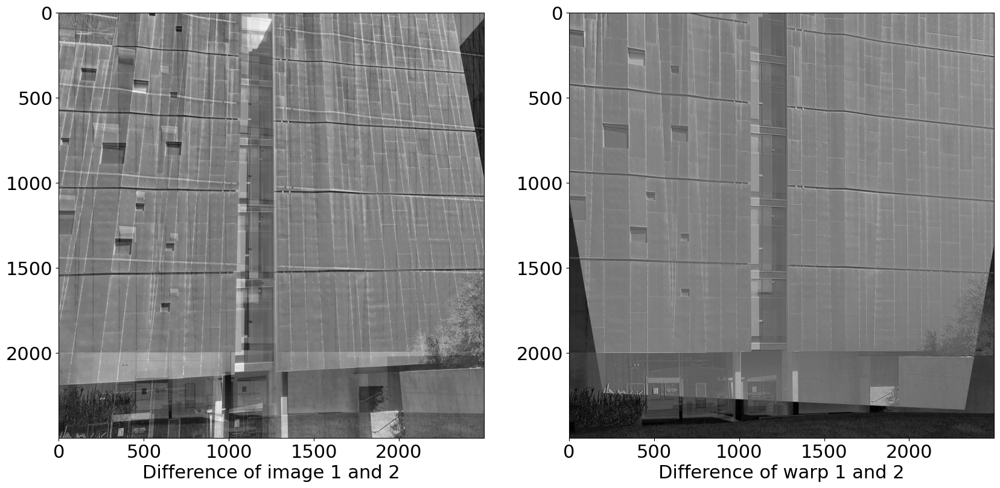

In [ ]:
plt.subplot(1,2,1)
plt.imshow((2.*img1-img2),cmap='gray')
plt.xlabel('Difference of image 1 and 2')
plt.subplot(1,2,2)
plt.imshow((2.*warpImage-img2), cmap='gray')
plt.xlabel('Difference of warp 1 and 2')



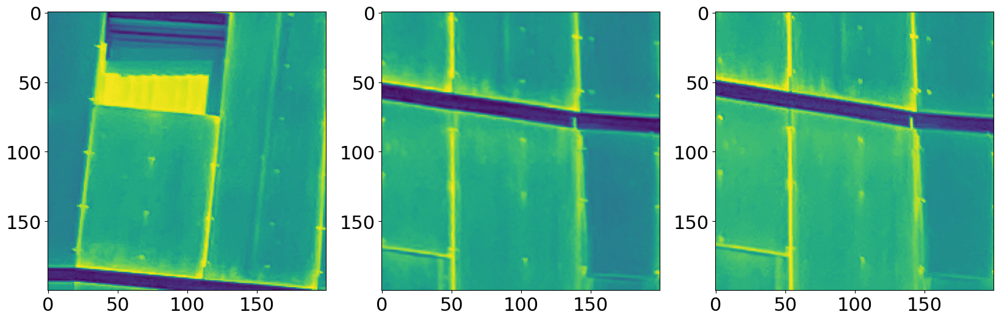

In [ ]:
plt.subplot(1,3,1)
plt.imshow(img1[400:600,400:600])
plt.subplot(1,3,2)
plt.imshow(warpImage[400:600,400:600])
plt.subplot(1,3,3)
plt.imshow(img2[400:600,400:600])

## Planar Object

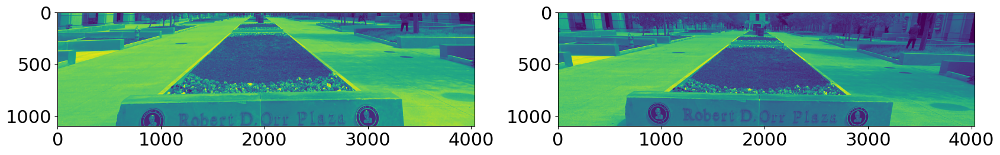

In [9]:
plt.subplot(1,2,1)
plt.imshow(tt[1924:3024, : ])
plt.subplot(1,2,2)
plt.imshow(bb[0:1100,: ])

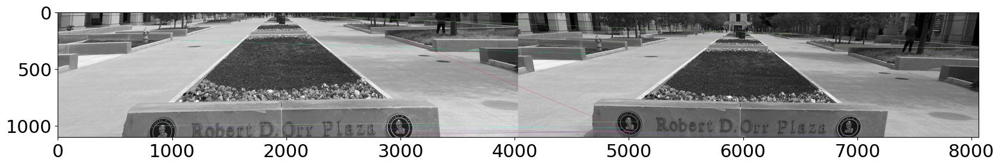

In [13]:
# Create a SIFT object
sift = cv2.SIFT_create()
tt1=tt[1924:3024, : ]
bb1=bb[0:1100,: ]
# Detect and compute keypoints and descriptors
kp1, des1 = sift.detectAndCompute(tt1, None)
kp2, des2 = sift.detectAndCompute(bb1, None)

# Create a BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

# Match the descriptors
matches = bf.match(des1, des2)

# Sort the matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw the first 10 matches
img3 = cv2.drawMatches(tt1, kp1, bb1, kp2, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Show the result
plt.imshow( img3)

In [14]:
# Define the FLANN matcher parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

# Create the FLANN matcher object
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Find the matches using KNN
matches = flann.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test to filter the good matches
good = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good.append(m)

# Check if there are enough good matches
if len(good) > 10:
    # Extract the source and destination points from the good matches
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Find the homography matrix using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Print the homography matrix
    print('Homography matrix:')
    print(H)
else:
    # Print an error message if not enough matches are found
    print('Not enough matches are found - {}/{}'.format(len(good), 10))

Homography matrix:
[[ 1.10961961e+00  3.08225194e-01 -1.90767731e+02]
 [ 4.09159371e-02  1.03263785e+00  5.25367520e+01]
 [ 7.68840883e-06  1.66195726e-04  1.00000000e+00]]


In [18]:
warpImage=cv2.warpPerspective(tt1,H,(4032,1100))

Text(0.5, 0, 'image 2')

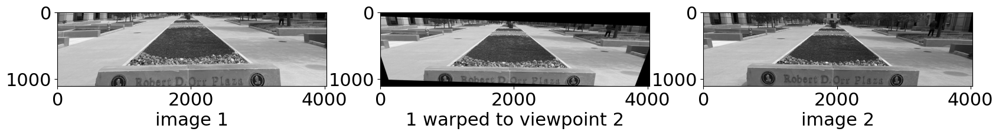

In [19]:
plt.subplot(1,3,1)
plt.imshow(tt1, cmap='gray')
plt.xlabel('image 1')
plt.subplot(1,3,2)
plt.imshow(warpImage, cmap='gray')
plt.xlabel('1 warped to viewpoint 2')
plt.subplot(1,3,3)
plt.imshow(bb1, cmap='gray')
plt.xlabel('image 2')



Text(0.5, 0, 'Sum of warp 1 and image 2')

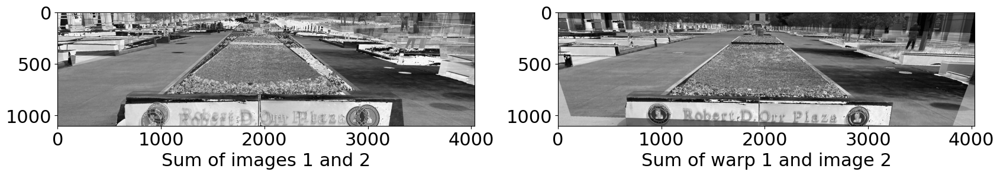

In [20]:

plt.subplot(1,2,1)
plt.imshow((tt1+bb1)/2., cmap='gray')
plt.xlabel('Sum of images 1 and 2')
plt.subplot(1,2,2)
plt.imshow((warpImage+bb1)/2., cmap='gray')
plt.xlabel('Sum of warp 1 and image 2')
